In [ ]:
#import required libraries
import numpy as np
import pandas as pd
from glob import glob
import matplotlib.pyplot as plt
from tensorflow.keras.layers import Input, Lambda, Dense, Flatten
from tensorflow.keras.models import Model
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.applications.vgg19 import VGG19
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential

In [ ]:
# ============================================================
# INSTALL REQUIRED LIBRARIES
# ============================================================

!pip install -q kagglehub
!pip install -q split-folders

# ============================================================
# IMPORT LIBRARIES
# ============================================================

import kagglehub
import splitfolders
import os

from glob import glob

# ============================================================
# DOWNLOAD DATASET
# ============================================================

path = kagglehub.dataset_download(
    "alxmamaev/flowers-recognition"
)

print("Dataset Path:")
print(path)

# ============================================================
# FIND FLOWERS FOLDER
# ============================================================

if "flowers" in os.listdir(path):

    dataset_path = os.path.join(
        path,
        "flowers"
    )

else:

    dataset_path = path

print("\nDataset Folder:")
print(dataset_path)

# ============================================================
# CREATE TRAIN / VAL / TEST SPLIT
# ============================================================

splitfolders.ratio(

    dataset_path,

    output="Datasets",

    seed=42,

    ratio=(0.70,0.15,0.15)

)

print("\nDataset Split Completed")

# ============================================================
# VERIFY DATASET STRUCTURE
# ============================================================

print("\nTrain Classes")

print(
    os.listdir(
        "Datasets/train"
    )
)

print("\nValidation Classes")

print(
    os.listdir(
        "Datasets/val"
    )
)

print("\nTest Classes")

print(
    os.listdir(
        "Datasets/test"
    )
)

# ============================================================
# PATHS
# ============================================================

train_path = "Datasets/train"

valid_path = "Datasets/val"

test_path = "Datasets/test"

# ============================================================
# IMAGE SIZE
# ============================================================

IMAGE_SIZE = [224,224]

# ============================================================
# FIND CLASSES
# ============================================================

folders = glob(
    train_path + "/*"
)

print("\nClasses Found:")

for folder in folders:

    print(
        os.path.basename(folder)
    )

print(
    "\nTotal Classes:",
    len(folders)
)

print("\nDataset Ready For VGG19")

Using Colab cache for faster access to the 'flowers-recognition' dataset.
Dataset Path:
/kaggle/input/flowers-recognition

Dataset Folder:
/kaggle/input/flowers-recognition/flowers


Copying files: 4317 files [00:07, 564.20 files/s]


Dataset Split Completed

Train Classes
['dandelion', 'sunflower', 'rose', 'tulip', 'daisy']

Validation Classes
['dandelion', 'sunflower', 'rose', 'tulip', 'daisy']

Test Classes
['dandelion', 'sunflower', 'rose', 'tulip', 'daisy']

Classes Found:
dandelion
sunflower
rose
tulip
daisy

Total Classes: 5

Dataset Ready For VGG19


TensorFlow Version: 2.20.0
Classes Found
dandelion
sunflower
rose
tulip
daisy

Total Classes: 5


,Class,Train,Validation,Test,Total
0,dandelion,736,157,159,1052
1,sunflower,513,109,111,733
2,rose,548,117,119,784
3,tulip,688,147,149,984
4,daisy,534,114,116,764


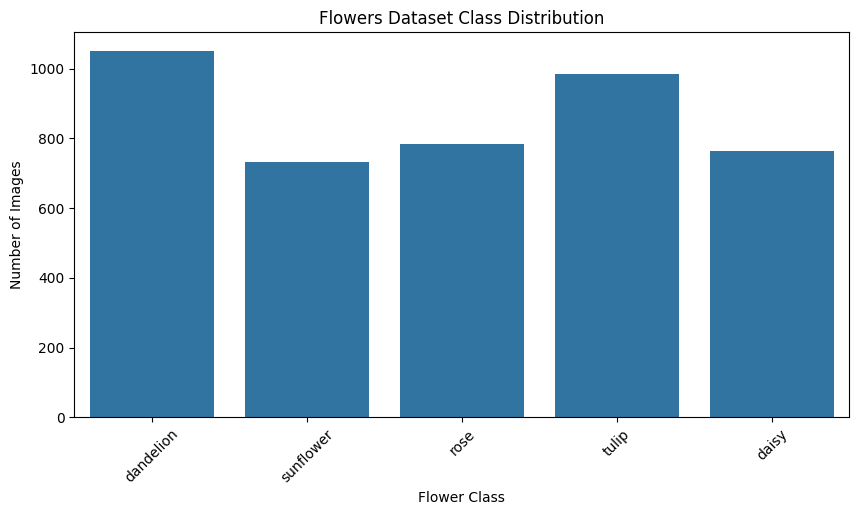

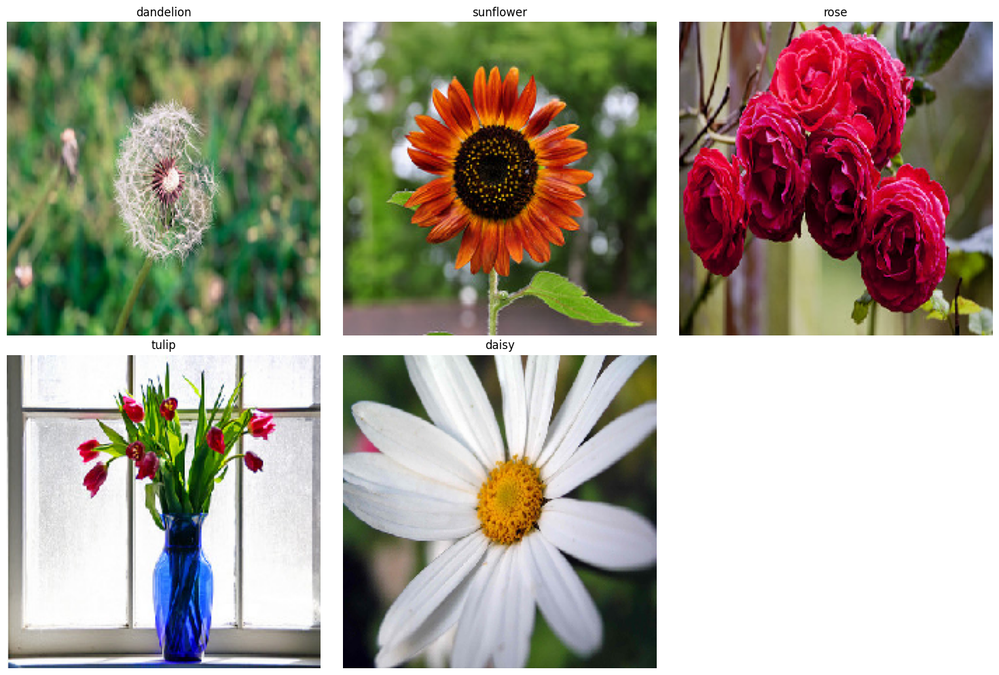

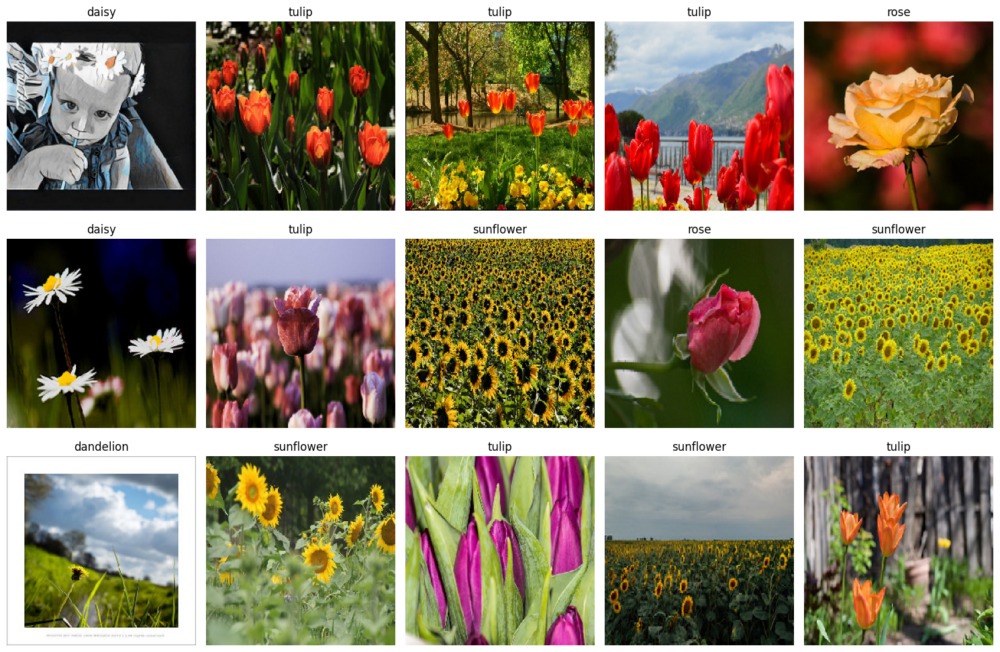

Image Shape
(333, 500, 3)

Height: 333
Width: 500
Channels: 3


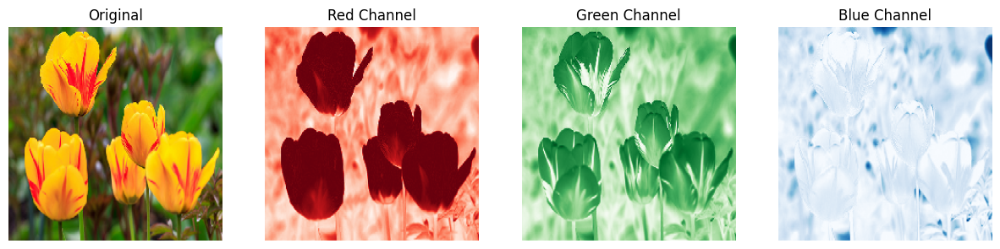

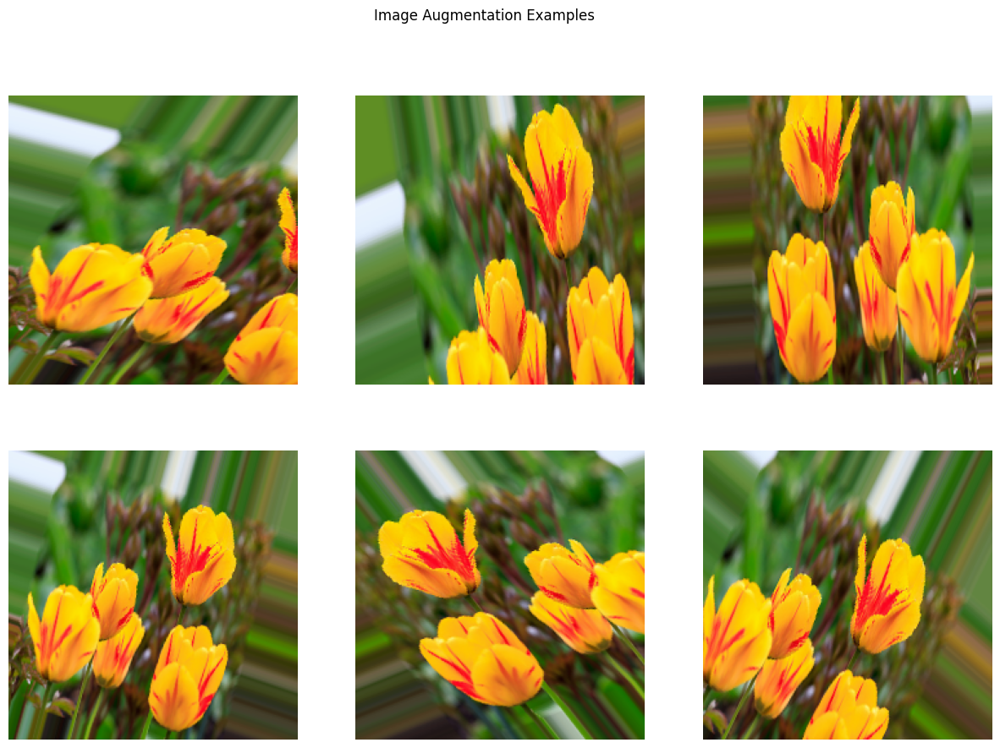

Found 3019 images belonging to 5 classes.
Found 644 images belonging to 5 classes.
Found 654 images belonging to 5 classes.

Class Indices
{'daisy': 0, 'dandelion': 1, 'rose': 2, 'sunflower': 3, 'tulip': 4}


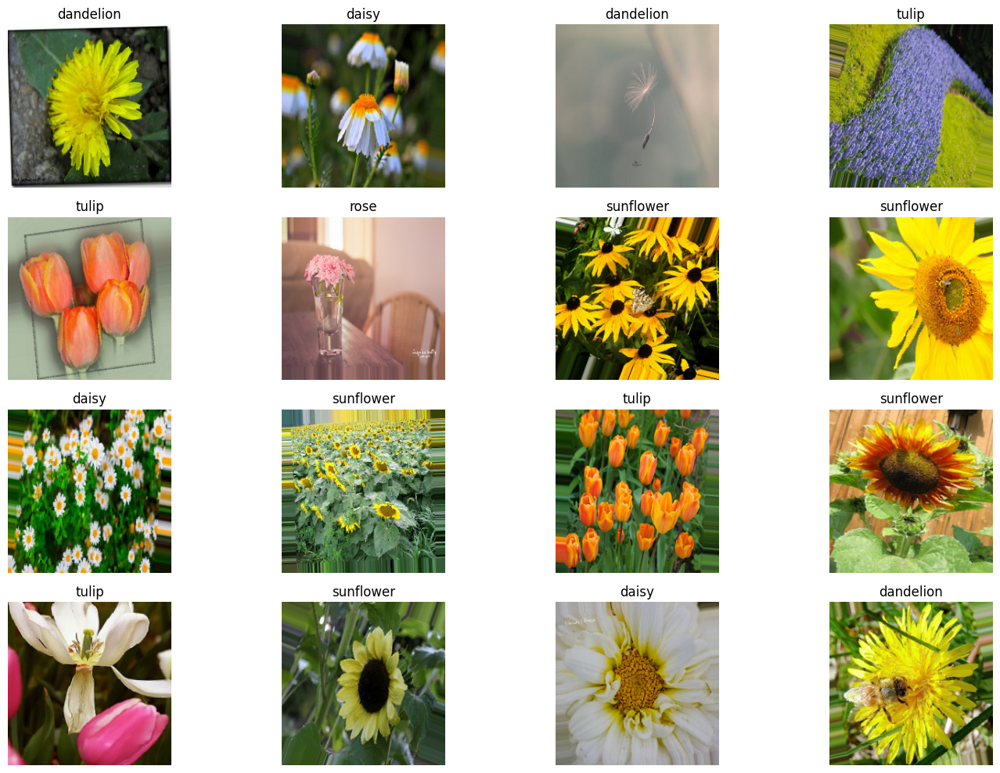


Training Samples
3019

Validation Samples
644

Testing Samples
654

Number of Classes
5


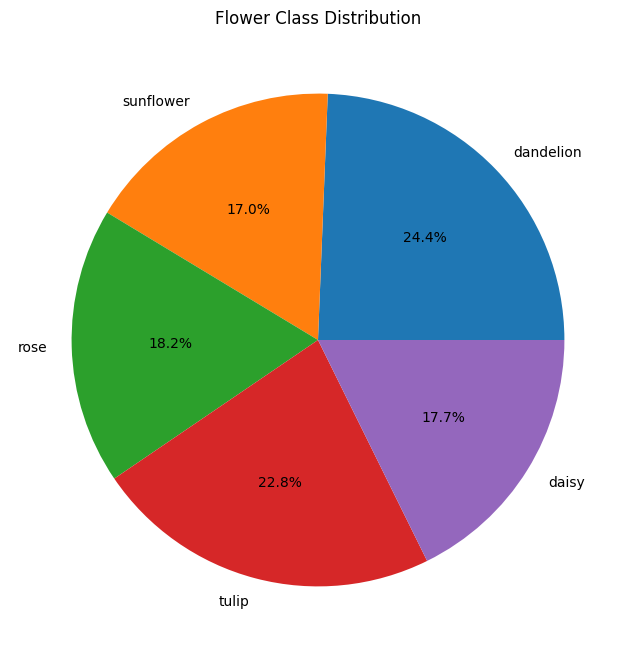

FLOWERS CLASSIFICATION PROJECT
Model       : VGG19 Transfer Learning
Classes     : 5
Image Size  : (224, 224)
Train Images: 3019
Val Images  : 644
Test Images : 654

MODULE 1 COMPLETED SUCCESSFULLY
Dataset Ready For VGG19 Transfer Learning


In [ ]:
# ============================================================
# MODULE 1
# FLOWERS DATASET EXPLORATION & PREPROCESSING
# ============================================================

# ============================================================
# SECTION 1: IMPORT LIBRARIES
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import tensorflow as tf

import kagglehub
import splitfolders
import os
import random

from glob import glob

from tensorflow.keras.preprocessing.image import (
    ImageDataGenerator,
    load_img,
    img_to_array
)

print("TensorFlow Version:", tf.__version__)

# ============================================================
# SECTION 2: DATASET PATHS
# ============================================================

train_path = "Datasets/train"
valid_path = "Datasets/val"
test_path = "Datasets/test"

IMAGE_SIZE = (224,224)

# ============================================================
# SECTION 3: FIND CLASSES
# ============================================================

folders = glob(
    train_path + "/*"
)

class_names = []

for folder in folders:

    class_names.append(
        os.path.basename(folder)
    )

print("Classes Found")

for cls in class_names:

    print(cls)

print(
    "\nTotal Classes:",
    len(class_names)
)

# ============================================================
# SECTION 4: DATASET OVERVIEW
# ============================================================

dataset_info = []

for cls in class_names:

    train_count = len(
        os.listdir(
            os.path.join(
                train_path,
                cls
            )
        )
    )

    val_count = len(
        os.listdir(
            os.path.join(
                valid_path,
                cls
            )
        )
    )

    test_count = len(
        os.listdir(
            os.path.join(
                test_path,
                cls
            )
        )
    )

    total_count = (
        train_count +
        val_count +
        test_count
    )

    dataset_info.append(

        [
            cls,
            train_count,
            val_count,
            test_count,
            total_count
        ]

    )

dataset_df = pd.DataFrame(

    dataset_info,

    columns=[
        "Class",
        "Train",
        "Validation",
        "Test",
        "Total"
    ]

)

display(dataset_df)

# ============================================================
# SECTION 5: CLASS DISTRIBUTION
# ============================================================

plt.figure(
    figsize=(10,5)
)

sns.barplot(
    data=dataset_df,
    x="Class",
    y="Total"
)

plt.title(
    "Flowers Dataset Class Distribution"
)

plt.xlabel(
    "Flower Class"
)

plt.ylabel(
    "Number of Images"
)

plt.xticks(
    rotation=45
)

plt.show()

# ============================================================
# SECTION 6: RANDOM SAMPLE IMAGES
# ============================================================

plt.figure(
    figsize=(15,10)
)

for i, cls in enumerate(class_names):

    image_path = random.choice(

        glob(
            os.path.join(
                train_path,
                cls,
                "*"
            )
        )

    )

    image = load_img(
        image_path,
        target_size=IMAGE_SIZE
    )

    plt.subplot(
        2,
        3,
        i+1
    )

    plt.imshow(image)

    plt.title(cls)

    plt.axis("off")

plt.tight_layout()

plt.show()

# ============================================================
# SECTION 7: VISUALIZE 15 RANDOM FLOWERS
# ============================================================

all_images = glob(
    train_path + "/*/*"
)

random_images = random.sample(
    all_images,
    15
)

plt.figure(
    figsize=(15,10)
)

for i, image_path in enumerate(random_images):

    image = load_img(
        image_path,
        target_size=IMAGE_SIZE
    )

    class_name = image_path.split("/")[-2]

    plt.subplot(
        3,
        5,
        i+1
    )

    plt.imshow(image)

    plt.title(class_name)

    plt.axis("off")

plt.tight_layout()

plt.show()

# ============================================================
# SECTION 8: IMAGE SHAPE ANALYSIS
# ============================================================

sample_image_path = random.choice(
    all_images
)

sample_image = load_img(
    sample_image_path
)

sample_array = img_to_array(
    sample_image
)

print("Image Shape")

print(
    sample_array.shape
)

print(
    "\nHeight:",
    sample_array.shape[0]
)

print(
    "Width:",
    sample_array.shape[1]
)

print(
    "Channels:",
    sample_array.shape[2]
)

# ============================================================
# SECTION 9: RGB CHANNEL VISUALIZATION
# ============================================================

image = load_img(
    sample_image_path,
    target_size=IMAGE_SIZE
)

image = img_to_array(
    image
).astype("uint8")

plt.figure(
    figsize=(15,5)
)

plt.subplot(1,4,1)

plt.imshow(image)

plt.title("Original")

plt.axis("off")

plt.subplot(1,4,2)

plt.imshow(
    image[:,:,0],
    cmap="Reds"
)

plt.title("Red Channel")

plt.axis("off")

plt.subplot(1,4,3)

plt.imshow(
    image[:,:,1],
    cmap="Greens"
)

plt.title("Green Channel")

plt.axis("off")

plt.subplot(1,4,4)

plt.imshow(
    image[:,:,2],
    cmap="Blues"
)

plt.title("Blue Channel")

plt.axis("off")

plt.show()

# ============================================================
# SECTION 10: IMAGE AUGMENTATION VISUALIZATION
# ============================================================

augmentation = ImageDataGenerator(

    rotation_range=40,

    zoom_range=0.3,

    width_shift_range=0.2,

    height_shift_range=0.2,

    shear_range=0.2,

    horizontal_flip=True,

    fill_mode="nearest"

)

image = load_img(
    sample_image_path,
    target_size=IMAGE_SIZE
)

image = img_to_array(
    image
)

image = np.expand_dims(
    image,
    axis=0
)

plt.figure(
    figsize=(15,10)
)

for i, batch in enumerate(

    augmentation.flow(
        image,
        batch_size=1
    )

):

    plt.subplot(
        2,
        3,
        i+1
    )

    plt.imshow(
        batch[0].astype("uint8")
    )

    plt.axis("off")

    if i == 5:
        break

plt.suptitle(
    "Image Augmentation Examples"
)

plt.show()

# ============================================================
# SECTION 11: CREATE DATA GENERATORS
# ============================================================

train_datagen = ImageDataGenerator(

    rescale=1./255,

    rotation_range=20,

    zoom_range=0.2,

    shear_range=0.2,

    horizontal_flip=True

)

validation_datagen = ImageDataGenerator(

    rescale=1./255

)

test_datagen = ImageDataGenerator(

    rescale=1./255

)

# ============================================================
# SECTION 12: TRAINING GENERATOR
# ============================================================

training_set = train_datagen.flow_from_directory(

    train_path,

    target_size=IMAGE_SIZE,

    batch_size=32,

    class_mode="categorical"

)

# ============================================================
# SECTION 13: VALIDATION GENERATOR
# ============================================================

validation_set = validation_datagen.flow_from_directory(

    valid_path,

    target_size=IMAGE_SIZE,

    batch_size=32,

    class_mode="categorical"

)

# ============================================================
# SECTION 14: TEST GENERATOR
# ============================================================

test_set = test_datagen.flow_from_directory(

    test_path,

    target_size=IMAGE_SIZE,

    batch_size=32,

    class_mode="categorical",

    shuffle=False

)

# ============================================================
# SECTION 15: CLASS INDICES
# ============================================================

print("\nClass Indices")

print(
    training_set.class_indices
)

# ============================================================
# SECTION 16: VISUALIZE BATCH FROM GENERATOR
# ============================================================

images, labels = next(
    training_set
)

plt.figure(
    figsize=(15,10)
)

for i in range(16):

    plt.subplot(
        4,
        4,
        i+1
    )

    plt.imshow(
        images[i]
    )

    class_name = list(
        training_set.class_indices.keys()
    )[

        np.argmax(
            labels[i]
        )

    ]

    plt.title(
        class_name
    )

    plt.axis("off")

plt.tight_layout()

plt.show()

# ============================================================
# SECTION 17: DATASET STATISTICS
# ============================================================

print("\nTraining Samples")

print(
    training_set.samples
)

print("\nValidation Samples")

print(
    validation_set.samples
)

print("\nTesting Samples")

print(
    test_set.samples
)

print("\nNumber of Classes")

print(
    len(class_names)
)

# ============================================================
# SECTION 18: CLASS DISTRIBUTION PIE CHART
# ============================================================

plt.figure(
    figsize=(8,8)
)

plt.pie(

    dataset_df["Total"],

    labels=dataset_df["Class"],

    autopct="%1.1f%%"

)

plt.title(
    "Flower Class Distribution"
)

plt.show()

# ============================================================
# SECTION 19: PROJECT OVERVIEW
# ============================================================

print("="*60)

print("FLOWERS CLASSIFICATION PROJECT")

print("="*60)

print("Model       : VGG19 Transfer Learning")

print("Classes     :", len(class_names))

print("Image Size  :", IMAGE_SIZE)

print("Train Images:", training_set.samples)

print("Val Images  :", validation_set.samples)

print("Test Images :", test_set.samples)

print("="*60)

# ============================================================
# SECTION 20: MODULE 1 COMPLETED
# ============================================================

print("\nMODULE 1 COMPLETED SUCCESSFULLY")
print("Dataset Ready For VGG19 Transfer Learning")

In [ ]:
# ============================================================
# MODULE 2
# VGG19 TRANSFER LEARNING MODEL BUILDING & TRAINING
# ============================================================

# ============================================================
# SECTION 21
# INTRODUCTION TO TRANSFER LEARNING
# ============================================================

print("="*60)

print("TRANSFER LEARNING")

print("="*60)

print("""
ImageNet Dataset
      ↓
Pretrained VGG19
      ↓
Feature Extraction
      ↓
Custom Classifier
      ↓
Flower Classification
""")

# ============================================================
# SECTION 22
# IMPORT VGG19
# ============================================================

from tensorflow.keras.applications import VGG19

from tensorflow.keras.layers import (

    Flatten,

    Dense,

    Dropout,

    BatchNormalization,

    GlobalAveragePooling2D

)

from tensorflow.keras.models import Model

# ============================================================
# SECTION 23
# LOAD PRETRAINED VGG19 MODEL
# ============================================================

vgg = VGG19(

    input_shape=(224,224,3),

    weights="imagenet",

    include_top=False

)

print("\nVGG19 Loaded Successfully")

# ============================================================
# SECTION 24
# VGG19 ARCHITECTURE SUMMARY
# ============================================================

print("\nBase Model Summary")

vgg.summary()

# ============================================================
# SECTION 25
# FREEZE PRETRAINED LAYERS
# ============================================================

for layer in vgg.layers:

    layer.trainable = False

print("\nAll VGG19 Layers Frozen")

# ============================================================
# SECTION 26
# VERIFY TRAINABLE STATUS
# ============================================================

trainable_layers = 0

non_trainable_layers = 0

for layer in vgg.layers:

    if layer.trainable:

        trainable_layers += 1

    else:

        non_trainable_layers += 1

print("Trainable Layers :", trainable_layers)

print("Frozen Layers    :", non_trainable_layers)

# ============================================================
# SECTION 27
# BUILD CUSTOM CLASSIFIER
# ============================================================

x = vgg.output

x = GlobalAveragePooling2D()(x)

x = Dense(

    512,

    activation="relu"

)(x)

x = BatchNormalization()(x)

x = Dropout(

    0.5

)(x)

x = Dense(

    256,

    activation="relu"

)(x)

x = BatchNormalization()(x)

x = Dropout(

    0.3

)(x)

prediction = Dense(

    len(class_names),

    activation="softmax"

)(x)

# ============================================================
# SECTION 28
# CREATE FINAL MODEL
# ============================================================

model = Model(

    inputs=vgg.input,

    outputs=prediction

)

print("\nCustom VGG19 Model Created")

# ============================================================
# SECTION 29
# FINAL MODEL SUMMARY
# ============================================================

model.summary()

# ============================================================
# SECTION 30
# VISUALIZE MODEL ARCHITECTURE
# ============================================================

from tensorflow.keras.utils import plot_model

plot_model(

    model,

    show_shapes=True,

    show_layer_names=True,

    dpi=100

)

# ============================================================
# SECTION 31
# MODEL PARAMETER ANALYSIS
# ============================================================

print("\nTotal Parameters")

print(model.count_params())

trainable_params = np.sum(

    [

        np.prod(v.shape)

        for v in model.trainable_weights

    ]

)

non_trainable_params = np.sum(

    [

        np.prod(v.shape)

        for v in model.non_trainable_weights

    ]

)

print("\nTrainable Parameters")

print(trainable_params)

print("\nNon Trainable Parameters")

print(non_trainable_params)

# ============================================================
# SECTION 32
# COMPILE MODEL
# ============================================================

model.compile(

    optimizer="adam",

    loss="categorical_crossentropy",

    metrics=["accuracy"]

)

print("\nModel Compiled Successfully")

# ============================================================
# SECTION 33
# CREATE CALLBACKS
# ============================================================

from tensorflow.keras.callbacks import (

    EarlyStopping,

    ModelCheckpoint,

    ReduceLROnPlateau

)

early_stop = EarlyStopping(

    monitor="val_loss",

    patience=5,

    restore_best_weights=True

)

checkpoint = ModelCheckpoint(

    "best_vgg19_model.keras",

    monitor="val_accuracy",

    save_best_only=True,

    verbose=1

)

reduce_lr = ReduceLROnPlateau(

    monitor="val_loss",

    factor=0.2,

    patience=3,

    min_lr=1e-6,

    verbose=1

)

print("\nCallbacks Ready")

# ============================================================
# SECTION 34
# TRAIN MODEL
# ============================================================

history = model.fit(

    training_set,

    validation_data=validation_set,

    epochs=20,

    callbacks=[

        early_stop,

        checkpoint,

        reduce_lr

    ]

)

# ============================================================
# SECTION 35
# SAVE FINAL MODEL
# ============================================================

model.save(

    "flowers_vgg19_final.keras"

)

print("\nModel Saved Successfully")

# ============================================================
# SECTION 36
# TRAINING HISTORY KEYS
# ============================================================

print(

    history.history.keys()

)

# ============================================================
# SECTION 37
# TRAINING SUMMARY
# ============================================================

best_train_acc = max(

    history.history["accuracy"]

)

best_val_acc = max(

    history.history["val_accuracy"]

)

print("\nBest Training Accuracy")

print(

    round(

        best_train_acc*100,

        2

    ),

    "%"

)

print("\nBest Validation Accuracy")

print(

    round(

        best_val_acc*100,

        2

    ),

    "%"

)

# ============================================================
# SECTION 38
# EPOCH-WISE ACCURACY TABLE
# ============================================================

history_df = pd.DataFrame(

    {

        "Epoch":

        range(

            1,

            len(

                history.history["accuracy"]

            ) + 1

        ),

        "Train Accuracy":

        history.history["accuracy"],

        "Validation Accuracy":

        history.history["val_accuracy"],

        "Train Loss":

        history.history["loss"],

        "Validation Loss":

        history.history["val_loss"]

    }

)

display(

    history_df.head()

)

# ============================================================
# SECTION 39
# BEST MODEL INFORMATION
# ============================================================

best_epoch = np.argmax(

    history.history["val_accuracy"]

) + 1

print(

    "\nBest Epoch:",

    best_epoch

)

print(

    "Best Validation Accuracy:",

    round(

        max(

            history.history["val_accuracy"]

        )*100,

        2

    ),

    "%"

)

# ============================================================
# SECTION 40
# MODULE 2 COMPLETED
# ============================================================

print("\n" + "="*60)

print("MODULE 2 COMPLETED SUCCESSFULLY")

print("="*60)

print("""
VGG19 Loaded
✓ Layers Frozen
✓ Custom Classifier Added
✓ Model Compiled
✓ Training Completed
✓ Best Model Saved

Ready For Evaluation Module
""")

TRANSFER LEARNING

ImageNet Dataset
      ↓
Pretrained VGG19
      ↓
Feature Extraction
      ↓
Custom Classifier
      ↓
Flower Classification


VGG19 Loaded Successfully

Base Model Summary


Model: "vgg19"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv4 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv4 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv4 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 20,024,384 (76.39 MB)

 Trainable params: 20,024,384 (76.39 MB)

 Non-trainable params: 0 (0.00 B)


All VGG19 Layers Frozen
Trainable Layers : 0
Frozen Layers    : 22

Custom VGG19 Model Created


Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv4 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv4 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv4 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 512)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 512)            │       262,656 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 20,422,725 (77.91 MB)

 Trainable params: 396,805 (1.51 MB)

 Non-trainable params: 20,025,920 (76.39 MB)


Total Parameters
20422725

Trainable Parameters
396805

Non Trainable Parameters
20025920

Model Compiled Successfully

Callbacks Ready
Epoch 1/20
95/95 ━━━━━━━━━━━━━━━━━━━━ 0s 549ms/step - accuracy: 0.5232 - loss: 1.4684
Epoch 1: val_accuracy improved from None to 0.53106, saving model to best_vgg19_model.keras

Epoch 1: finished saving model to best_vgg19_model.keras
95/95 ━━━━━━━━━━━━━━━━━━━━ 72s 617ms/step - accuracy: 0.6028 - loss: 1.2055 - val_accuracy: 0.5311 - val_loss: 1.1800 - learning_rate: 0.0010
Epoch 2/20
95/95 ━━━━━━━━━━━━━━━━━━━━ 0s 481ms/step - accuracy: 0.7070 - loss: 0.8662
Epoch 2: val_accuracy improved from 0.53106 to 0.71739, saving model to best_vgg19_model.keras

Epoch 2: finished saving model to best_vgg19_model.keras
95/95 ━━━━━━━━━━━━━━━━━━━━ 51s 531ms/step - accuracy: 0.7029 - loss: 0.8649 - val_accuracy: 0.7174 - val_loss: 0.8919 - learning_rate: 0.0010
Epoch 3/20
95/95 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step - accuracy: 0.7246 - loss: 0.7615
Epoch 3: val_accur

,Epoch,Train Accuracy,Validation Accuracy,Train Loss,Validation Loss
0,1,0.602849,0.531056,1.205547,1.179958
1,2,0.702882,0.717391,0.864895,0.891934
2,3,0.719444,0.743789,0.764772,0.732400
3,4,0.753230,0.791925,0.695904,0.612424
4,5,0.767141,0.801242,0.668757,0.602495



Best Epoch: 19
Best Validation Accuracy: 82.76 %

MODULE 2 COMPLETED SUCCESSFULLY

VGG19 Loaded
✓ Layers Frozen
✓ Custom Classifier Added
✓ Model Compiled
✓ Training Completed
✓ Best Model Saved

Ready For Evaluation Module



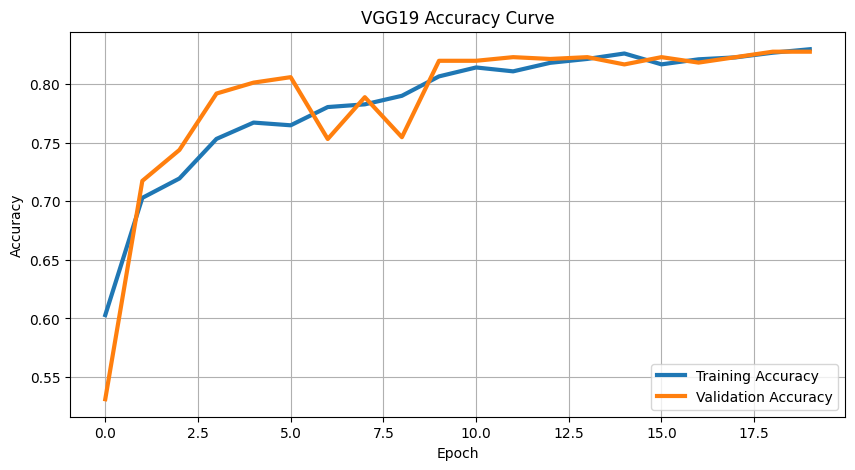

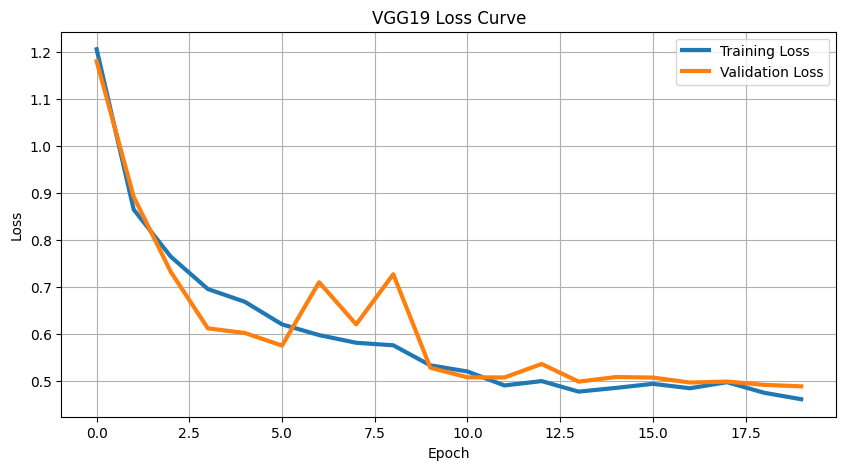

21/21 ━━━━━━━━━━━━━━━━━━━━ 5s 234ms/step - accuracy: 0.8471 - loss: 0.4089

Test Accuracy
84.71 %

Test Loss
0.4089
21/21 ━━━━━━━━━━━━━━━━━━━━ 6s 236ms/step


,Actual,Predicted
0,daisy,daisy
1,daisy,daisy
2,daisy,daisy
3,daisy,daisy
4,daisy,daisy
5,daisy,daisy
6,daisy,daisy
7,daisy,daisy
8,daisy,daisy
9,daisy,daisy


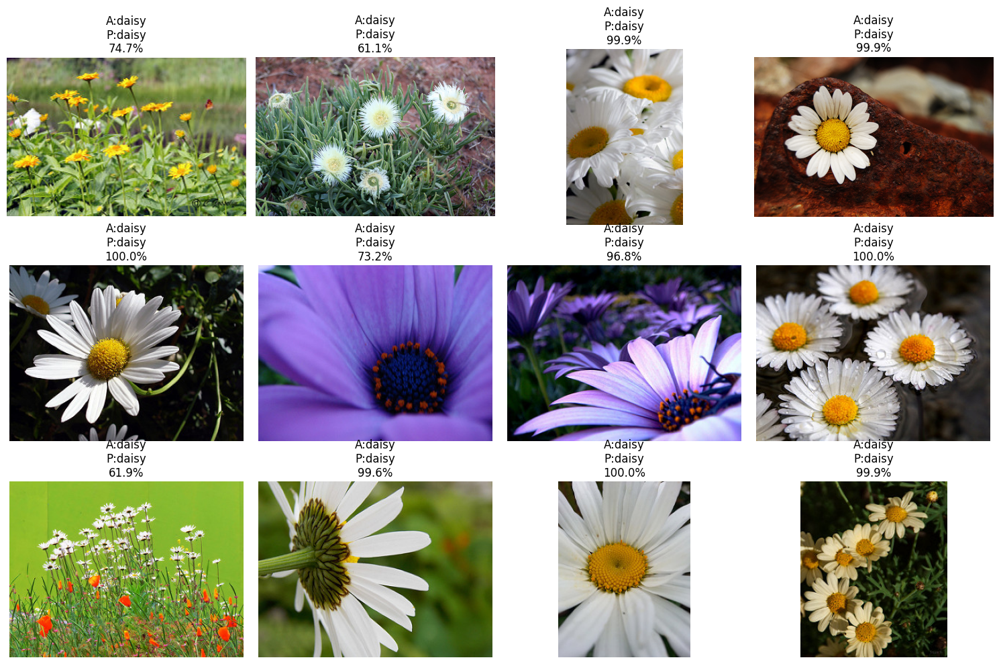


Top 3 Predictions

daisy : 100.0 %
tulip : 0.0 %
dandelion : 0.0 %


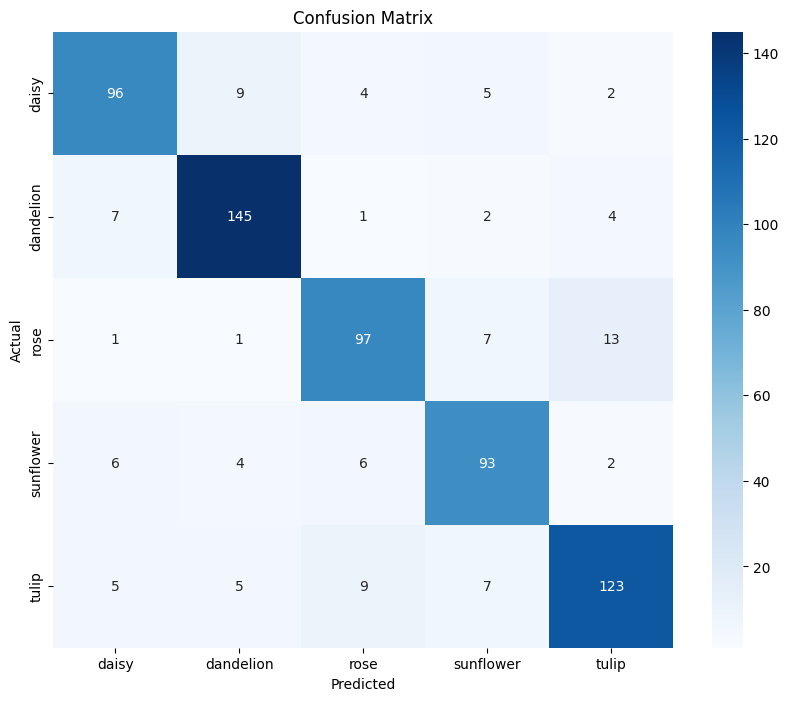

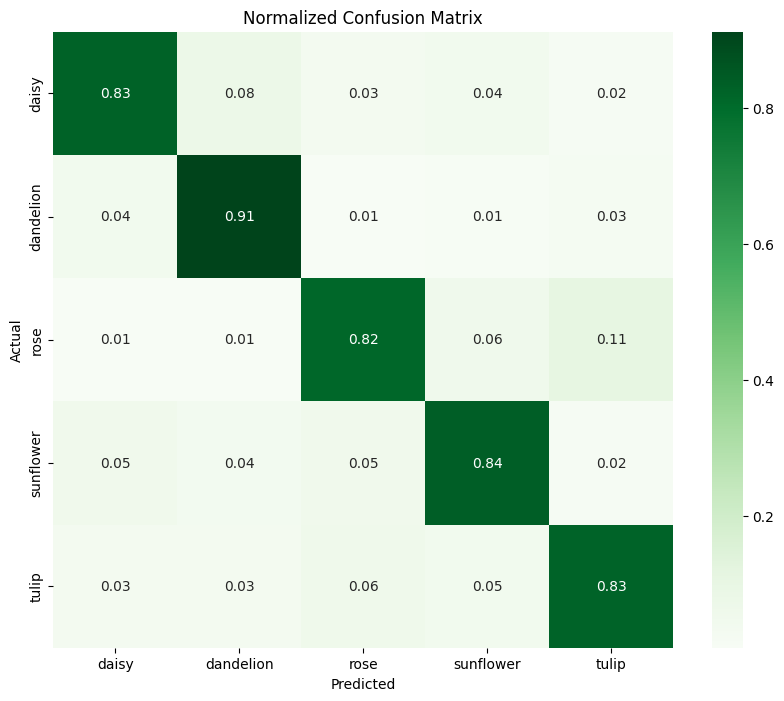

              precision    recall  f1-score   support

       daisy       0.83      0.83      0.83       116
   dandelion       0.88      0.91      0.90       159
        rose       0.83      0.82      0.82       119
   sunflower       0.82      0.84      0.83       111
       tulip       0.85      0.83      0.84       149

    accuracy                           0.85       654
   macro avg       0.84      0.84      0.84       654
weighted avg       0.85      0.85      0.85       654



,precision,recall,f1-score,support
daisy,0.834783,0.827586,0.831169,116.000000
dandelion,0.884146,0.911950,0.897833,159.000000
rose,0.829060,0.815126,0.822034,119.000000
sunflower,0.815789,0.837838,0.826667,111.000000
tulip,0.854167,0.825503,0.839590,149.000000
accuracy,0.847095,0.847095,0.847095,0.847095
macro avg,0.843589,0.843601,0.843459,654.000000
weighted avg,0.846935,0.847095,0.846869,654.000000


,Class,Accuracy
0,daisy,82.758621
1,dandelion,91.194969
2,rose,81.512605
3,sunflower,83.783784
4,tulip,82.550336


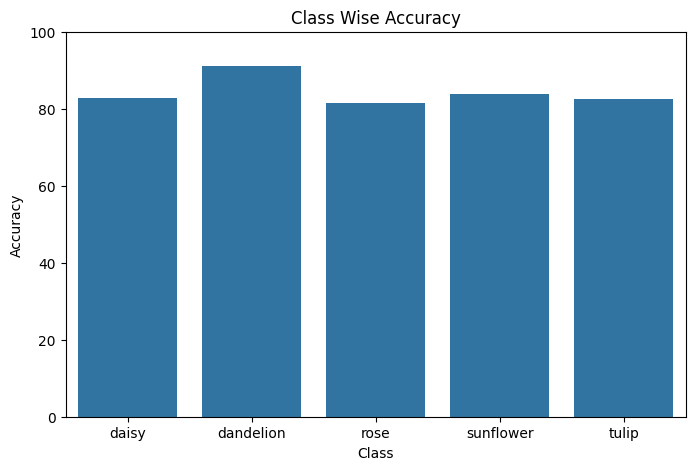

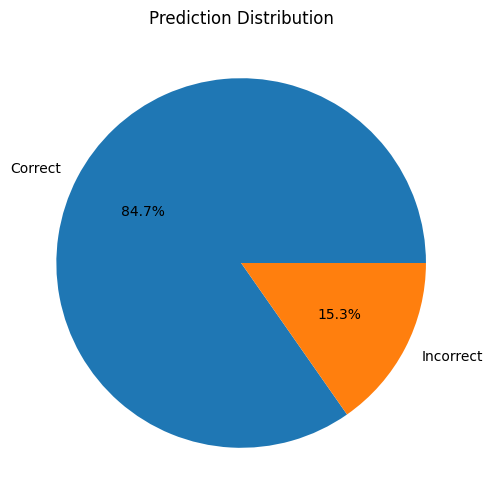

Total Misclassified Images: 100


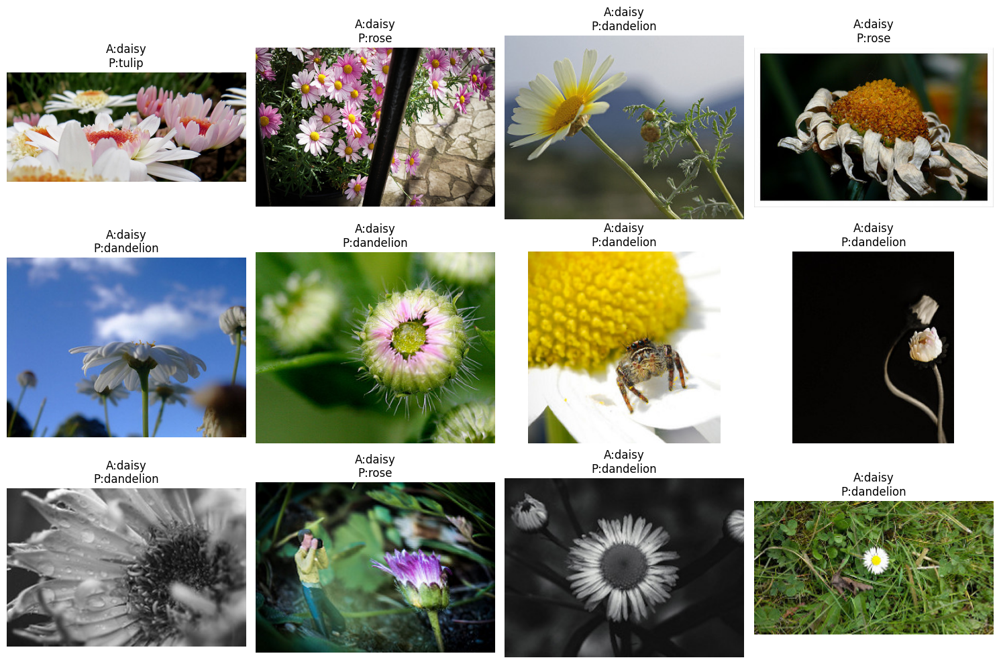

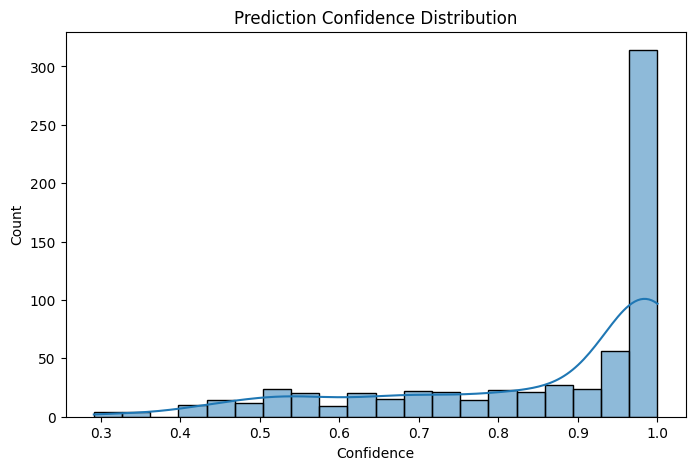

FLOWERS CLASSIFICATION PERFORMANCE
Model              : VGG19
Classes            : 5
Test Accuracy      : 84.71 %
Correct Predictions: 554
Wrong Predictions  : 100
Test Images        : 654

MODULE 3 COMPLETED SUCCESSFULLY


✓ Accuracy Curve

✓ Loss Curve

✓ Predictions

✓ Actual vs Predicted

✓ Confusion Matrix

✓ Classification Report

✓ Misclassified Images

✓ Class Wise Accuracy

✓ Confidence Analysis

Ready For Explainable AI Module

(Module 4)



In [ ]:
# ============================================================
# MODULE 3
# MODEL EVALUATION & PERFORMANCE VISUALIZATION
# ============================================================

# ============================================================
# SECTION 41
# ACCURACY CURVE
# ============================================================

plt.figure(
    figsize=(10,5)
)

plt.plot(
    history.history["accuracy"],
    label="Training Accuracy",
    linewidth=3
)

plt.plot(
    history.history["val_accuracy"],
    label="Validation Accuracy",
    linewidth=3
)

plt.title(
    "VGG19 Accuracy Curve"
)

plt.xlabel(
    "Epoch"
)

plt.ylabel(
    "Accuracy"
)

plt.legend()

plt.grid()

plt.show()

# ============================================================
# SECTION 42
# LOSS CURVE
# ============================================================

plt.figure(
    figsize=(10,5)
)

plt.plot(
    history.history["loss"],
    label="Training Loss",
    linewidth=3
)

plt.plot(
    history.history["val_loss"],
    label="Validation Loss",
    linewidth=3
)

plt.title(
    "VGG19 Loss Curve"
)

plt.xlabel(
    "Epoch"
)

plt.ylabel(
    "Loss"
)

plt.legend()

plt.grid()

plt.show()

# ============================================================
# SECTION 43
# MODEL EVALUATION
# ============================================================

loss, accuracy = model.evaluate(
    test_set
)

print("\nTest Accuracy")

print(
    round(
        accuracy*100,
        2
    ),
    "%"
)

print("\nTest Loss")

print(
    round(
        loss,
        4
    )
)

# ============================================================
# SECTION 44
# GENERATE PREDICTIONS
# ============================================================

predictions = model.predict(
    test_set
)

predicted_classes = np.argmax(
    predictions,
    axis=1
)

actual_classes = test_set.classes

# ============================================================
# SECTION 45
# ACTUAL VS PREDICTED TABLE
# ============================================================

comparison = pd.DataFrame({

    "Actual":

    actual_classes[:20],

    "Predicted":

    predicted_classes[:20]

})

index_to_class = {

    v:k

    for k,v in

    training_set.class_indices.items()

}

comparison["Actual"] = comparison["Actual"].map(
    index_to_class
)

comparison["Predicted"] = comparison["Predicted"].map(
    index_to_class
)

display(
    comparison
)

# ============================================================
# SECTION 46
# IMAGE PREDICTIONS WITH CONFIDENCE
# ============================================================

plt.figure(
    figsize=(15,10)
)

for i in range(12):

    image = plt.imread(
        test_set.filepaths[i]
    )

    confidence = np.max(
        predictions[i]
    )

    actual = index_to_class[
        actual_classes[i]
    ]

    predicted = index_to_class[
        predicted_classes[i]
    ]

    plt.subplot(
        3,
        4,
        i+1
    )

    plt.imshow(
        image
    )

    plt.title(

        f"A:{actual}\n"

        f"P:{predicted}\n"

        f"{confidence*100:.1f}%"

    )

    plt.axis("off")

plt.tight_layout()

plt.show()

# ============================================================
# SECTION 47
# TOP-3 PREDICTIONS
# ============================================================

sample_index = 10

top3 = np.argsort(
    predictions[sample_index]
)[::-1][:3]

print("\nTop 3 Predictions\n")

for idx in top3:

    print(

        index_to_class[idx],

        ":",

        round(

            predictions[sample_index][idx]*100,

            2

        ),

        "%"

    )

# ============================================================
# SECTION 48
# CONFUSION MATRIX
# ============================================================

from sklearn.metrics import confusion_matrix

cm = confusion_matrix(

    actual_classes,

    predicted_classes

)

plt.figure(
    figsize=(10,8)
)

sns.heatmap(

    cm,

    annot=True,

    fmt="d",

    cmap="Blues",

    xticklabels=index_to_class.values(),

    yticklabels=index_to_class.values()

)

plt.xlabel(
    "Predicted"
)

plt.ylabel(
    "Actual"
)

plt.title(
    "Confusion Matrix"
)

plt.show()

# ============================================================
# SECTION 49
# NORMALIZED CONFUSION MATRIX
# ============================================================

cm_normalized = cm.astype(
    "float"
) / cm.sum(
    axis=1
)[:,np.newaxis]

plt.figure(
    figsize=(10,8)
)

sns.heatmap(

    cm_normalized,

    annot=True,

    cmap="Greens",

    fmt=".2f",

    xticklabels=index_to_class.values(),

    yticklabels=index_to_class.values()

)

plt.title(
    "Normalized Confusion Matrix"
)

plt.xlabel(
    "Predicted"
)

plt.ylabel(
    "Actual"
)

plt.show()

# ============================================================
# SECTION 50
# CLASSIFICATION REPORT
# ============================================================

from sklearn.metrics import classification_report

report = classification_report(

    actual_classes,

    predicted_classes,

    target_names=list(
        index_to_class.values()
    )

)

print(report)

# ============================================================
# SECTION 51
# CLASSIFICATION REPORT DATAFRAME
# ============================================================

report_df = pd.DataFrame(

    classification_report(

        actual_classes,

        predicted_classes,

        target_names=list(
            index_to_class.values()
        ),

        output_dict=True

    )

).transpose()

display(
    report_df
)

# ============================================================
# SECTION 52
# CLASS-WISE ACCURACY
# ============================================================

class_accuracy = cm.diagonal() / cm.sum(
    axis=1
)

accuracy_df = pd.DataFrame({

    "Class":

    list(
        index_to_class.values()
    ),

    "Accuracy":

    class_accuracy*100

})

display(
    accuracy_df
)

plt.figure(
    figsize=(8,5)
)

sns.barplot(

    data=accuracy_df,

    x="Class",

    y="Accuracy"

)

plt.title(
    "Class Wise Accuracy"
)

plt.ylim(
    0,
    100
)

plt.show()

# ============================================================
# SECTION 53
# CORRECT VS INCORRECT PREDICTIONS
# ============================================================

correct = np.sum(

    actual_classes == predicted_classes

)

incorrect = np.sum(

    actual_classes != predicted_classes

)

plt.figure(
    figsize=(6,6)
)

plt.pie(

    [correct, incorrect],

    labels=[
        "Correct",
        "Incorrect"
    ],

    autopct="%1.1f%%"

)

plt.title(
    "Prediction Distribution"
)

plt.show()

# ============================================================
# SECTION 54
# MISCLASSIFIED IMAGES
# ============================================================

misclassified = np.where(

    actual_classes != predicted_classes

)[0]

print(

    "Total Misclassified Images:",

    len(
        misclassified
    )

)

plt.figure(
    figsize=(15,10)
)

for i, idx in enumerate(

    misclassified[:12]

):

    image = plt.imread(
        test_set.filepaths[idx]
    )

    plt.subplot(
        3,
        4,
        i+1
    )

    plt.imshow(
        image
    )

    plt.title(

        f"A:{index_to_class[actual_classes[idx]]}\n"

        f"P:{index_to_class[predicted_classes[idx]]}"

    )

    plt.axis("off")

plt.tight_layout()

plt.show()

# ============================================================
# SECTION 55
# CONFIDENCE DISTRIBUTION
# ============================================================

confidence_scores = np.max(
    predictions,
    axis=1
)

plt.figure(
    figsize=(8,5)
)

sns.histplot(

    confidence_scores,

    bins=20,

    kde=True

)

plt.title(
    "Prediction Confidence Distribution"
)

plt.xlabel(
    "Confidence"
)

plt.show()

# ============================================================
# SECTION 56
# MODEL PERFORMANCE DASHBOARD
# ============================================================

print("="*60)

print("FLOWERS CLASSIFICATION PERFORMANCE")

print("="*60)

print(

    "Model              : VGG19"

)

print(

    "Classes            :",

    len(index_to_class)

)

print(

    "Test Accuracy      :",

    round(
        accuracy*100,
        2
    ),
    "%"
)

print(

    "Correct Predictions:",

    correct

)

print(

    "Wrong Predictions  :",

    incorrect

)

print(

    "Test Images        :",

    len(actual_classes)

)

print("="*60)

# ============================================================
# SECTION 57
# MODULE 3 COMPLETED
# ============================================================

print("\nMODULE 3 COMPLETED SUCCESSFULLY")

print("""

✓ Accuracy Curve

✓ Loss Curve

✓ Predictions

✓ Actual vs Predicted

✓ Confusion Matrix

✓ Classification Report

✓ Misclassified Images

✓ Class Wise Accuracy

✓ Confidence Analysis

Ready For Explainable AI Module

(Module 4)
""")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step
Feature Map Shape
(1, 224, 224, 64)


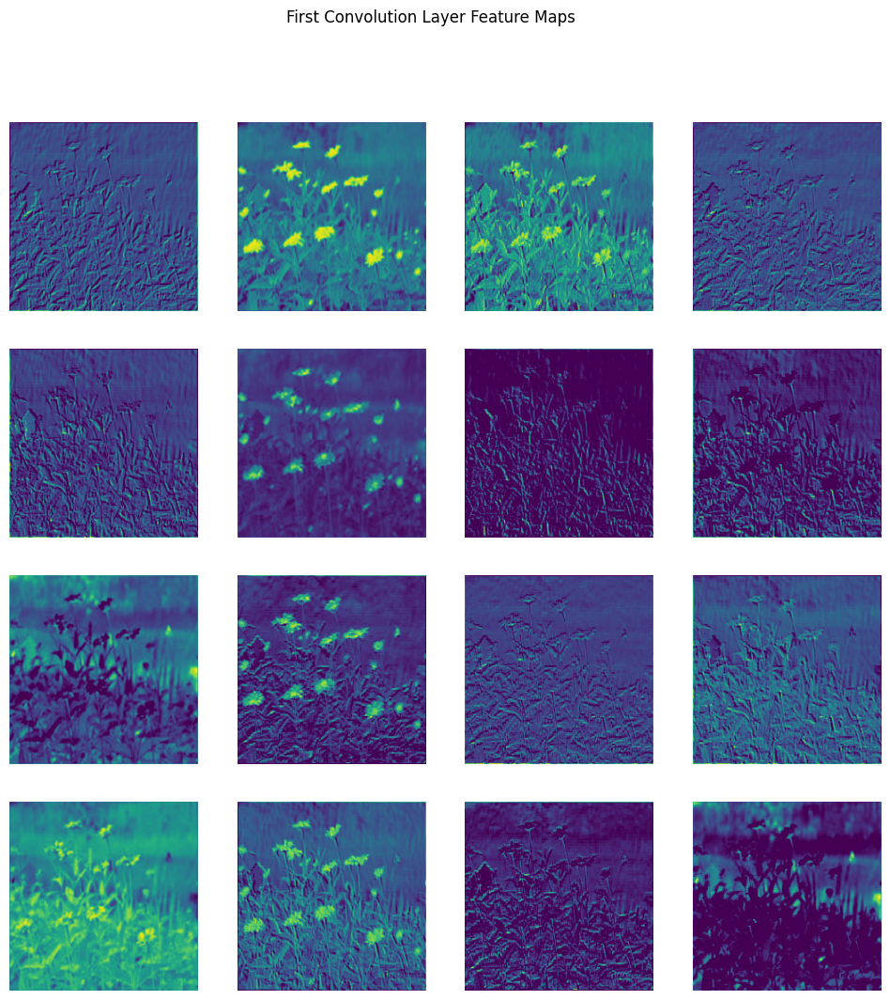

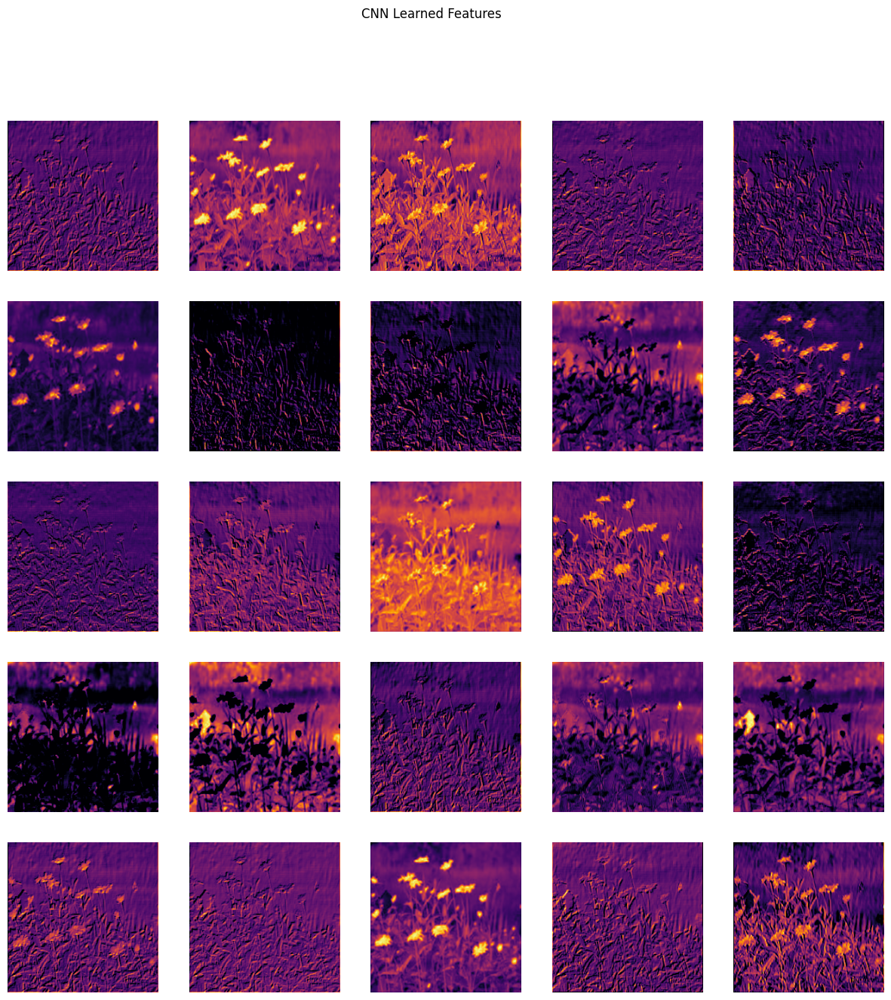

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 596ms/step
Number of Activation Layers: 10


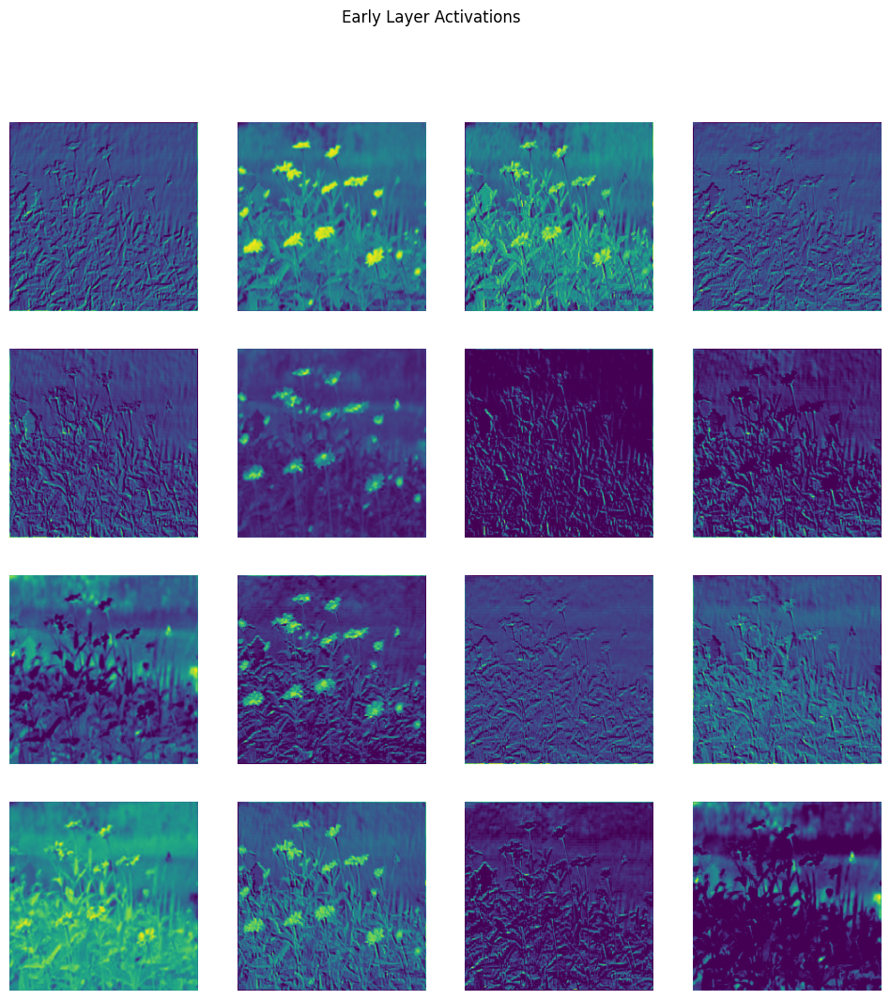

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 668ms/step


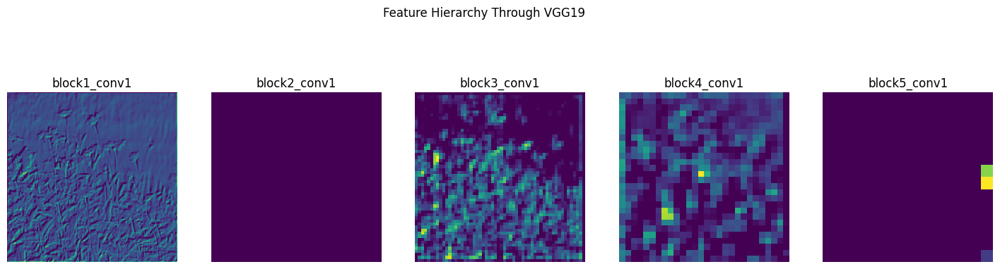

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 855ms/step
Predicted Class: daisy


/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_38']
Received: inputs=Tensor(shape=(1, 224, 224, 3))
  warnings.warn(msg)


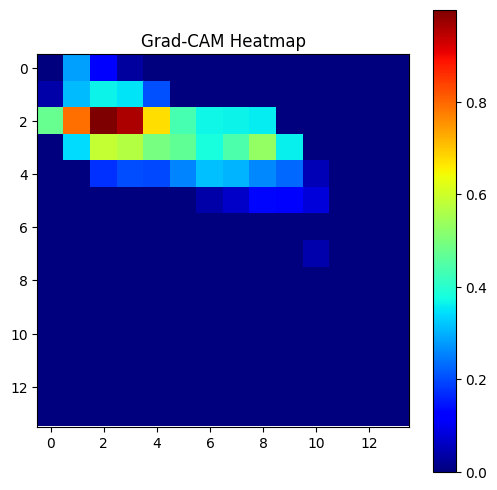

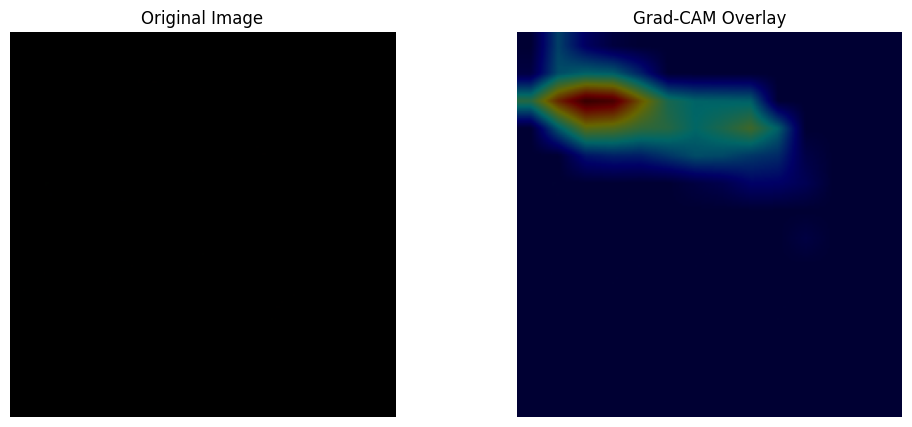

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


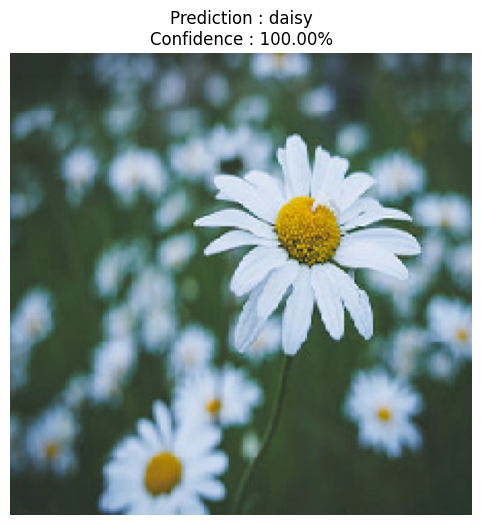


Top 5 Predictions

daisy : 100.0 %
sunflower : 0.0 %
dandelion : 0.0 %
rose : 0.0 %
tulip : 0.0 %

Model Saved Successfully

FLOWERS CLASSIFICATION USING VGG19
Dataset          : Flowers Recognition
Classes          : 5
Image Size       : 224 x 224
Model            : VGG19 Transfer Learning
Train Images     : 3019
Validation Images: 644
Test Images      : 654
Test Accuracy    : 84.71 %


✓ Feature Maps Visualized

✓ Layer Activations Visualized

✓ VGG19 Feature Hierarchy Visualized

✓ Grad-CAM Implemented

✓ Single Image Prediction

✓ Top-5 Prediction Analysis

✓ Model Saved Successfully

✓ Complete Transfer Learning Project Finished




In [ ]:
# ============================================================
# MODULE 4
# EXPLAINABLE AI (XAI)
# FEATURE MAPS • ACTIVATIONS • GRAD-CAM
# SINGLE IMAGE PREDICTION
# ============================================================

# ============================================================
# SECTION 58
# FEATURE MAP VISUALIZATION
# ============================================================

from tensorflow.keras.models import Model

# First Convolution Layer

first_conv_layer = model.get_layer(
    "block1_conv1"
)

feature_model = Model(

    inputs=model.input,

    outputs=first_conv_layer.output

)

# Sample Image

sample_image = test_set[0][0][0]

sample_image_batch = np.expand_dims(
    sample_image,
    axis=0
)

feature_maps = feature_model.predict(
    sample_image_batch
)

print("Feature Map Shape")

print(feature_maps.shape)

# ============================================================
# SECTION 59
# VISUALIZE FEATURE MAPS
# ============================================================

plt.figure(
    figsize=(12,12)
)

for i in range(16):

    plt.subplot(
        4,
        4,
        i+1
    )

    plt.imshow(

        feature_maps[0,:,:,i],

        cmap="viridis"

    )

    plt.axis("off")

plt.suptitle(
    "First Convolution Layer Feature Maps"
)

plt.show()

# ============================================================
# SECTION 60
# MULTIPLE FEATURE MAP VISUALIZATION
# ============================================================

plt.figure(
    figsize=(15,15)
)

for i in range(25):

    plt.subplot(
        5,
        5,
        i+1
    )

    plt.imshow(

        feature_maps[0,:,:,i],

        cmap="inferno"

    )

    plt.axis("off")

plt.suptitle(
    "CNN Learned Features"
)

plt.show()

# ============================================================
# SECTION 61
# INTERMEDIATE LAYER ACTIVATIONS
# ============================================================

layer_outputs = [

    layer.output

    for layer in model.layers[:10]

]

activation_model = Model(

    inputs=model.input,

    outputs=layer_outputs

)

activations = activation_model.predict(
    sample_image_batch
)

print(

    "Number of Activation Layers:",

    len(activations)

)

# ============================================================
# SECTION 62
# VISUALIZE EARLY ACTIVATIONS
# ============================================================

activation = activations[1]

plt.figure(
    figsize=(12,12)
)

for i in range(16):

    plt.subplot(
        4,
        4,
        i+1
    )

    plt.imshow(

        activation[0,:,:,i],

        cmap="viridis"

    )

    plt.axis("off")

plt.suptitle(
    "Early Layer Activations"
)

plt.show()

# ============================================================
# SECTION 63
# VGG19 FEATURE HIERARCHY
# ============================================================

selected_layers = [

    "block1_conv1",

    "block2_conv1",

    "block3_conv1",

    "block4_conv1",

    "block5_conv1"

]

outputs = [

    model.get_layer(
        layer
    ).output

    for layer in selected_layers

]

hierarchy_model = Model(

    inputs=model.input,

    outputs=outputs

)

hierarchy_maps = hierarchy_model.predict(
    sample_image_batch
)

# ============================================================
# SECTION 64
# VISUALIZE FEATURE HIERARCHY
# ============================================================

fig, axes = plt.subplots(

    1,

    5,

    figsize=(18,5)

)

for i, fmap in enumerate(

    hierarchy_maps

):

    axes[i].imshow(

        fmap[0,:,:,0],

        cmap="viridis"

    )

    axes[i].set_title(

        selected_layers[i]

    )

    axes[i].axis("off")

plt.suptitle(
    "Feature Hierarchy Through VGG19"
)

plt.show()

# ============================================================
# SECTION 65
# GRAD-CAM IMPORTS
# ============================================================

import tensorflow as tf
import cv2

# ============================================================
# SECTION 66
# PREPARE IMAGE FOR GRAD-CAM
# ============================================================

sample_image = test_set[0][0][0]

sample_image_batch = np.expand_dims(
    sample_image,
    axis=0
)

preds = model.predict(
    sample_image_batch
)

predicted_class = np.argmax(
    preds[0]
)

print(

    "Predicted Class:",

    list(
        training_set.class_indices.keys()
    )[predicted_class]

)

# ============================================================
# SECTION 67
# FIND LAST CONVOLUTIONAL LAYER
# ============================================================

last_conv_layer = model.get_layer(
    "block5_conv4"
)

grad_model = Model(

    inputs=model.inputs,

    outputs=[

        last_conv_layer.output,

        model.output

    ]

)

# ============================================================
# SECTION 68
# COMPUTE GRADIENTS
# ============================================================

with tf.GradientTape() as tape:

    conv_outputs, predictions = grad_model(
        sample_image_batch
    )

    loss = predictions[:,predicted_class]

grads = tape.gradient(

    loss,

    conv_outputs

)

pooled_grads = tf.reduce_mean(

    grads,

    axis=(0,1,2)

)

# ============================================================
# SECTION 69
# GENERATE HEATMAP
# ============================================================

conv_outputs = conv_outputs[0]

heatmap = tf.reduce_sum(

    pooled_grads * conv_outputs,

    axis=-1

)

heatmap = np.maximum(
    heatmap,
    0
)

heatmap = heatmap / (
    np.max(heatmap) + 1e-8
)

# DO NOT USE heatmap.numpy()

# ============================================================
# SECTION 70
# DISPLAY HEATMAP
# ============================================================

plt.figure(
    figsize=(6,6)
)

plt.imshow(
    heatmap,
    cmap="jet"
)

plt.colorbar()

plt.title(
    "Grad-CAM Heatmap"
)

plt.show()

# ============================================================
# SECTION 71
# OVERLAY HEATMAP
# ============================================================

image = np.array(
    sample_image
)

image = image.astype(
    "uint8"
)

heatmap = cv2.resize(

    heatmap,

    (
        image.shape[1],
        image.shape[0]
    )

)

heatmap = np.uint8(
    255 * heatmap
)

heatmap_color = cv2.applyColorMap(

    heatmap,

    cv2.COLORMAP_JET

)

superimposed_img = cv2.addWeighted(

    image,

    0.6,

    heatmap_color,

    0.4,

    0

)

# ============================================================
# SECTION 72
# VISUALIZE GRAD-CAM OVERLAY
# ============================================================

plt.figure(
    figsize=(12,5)
)

plt.subplot(
    1,
    2,
    1
)

plt.imshow(image)

plt.title(
    "Original Image"
)

plt.axis("off")

plt.subplot(
    1,
    2,
    2
)

plt.imshow(
    cv2.cvtColor(
        superimposed_img,
        cv2.COLOR_BGR2RGB
    )
)

plt.title(
    "Grad-CAM Overlay"
)

plt.axis("off")

plt.show()

# ============================================================
# SECTION 73
# SINGLE IMAGE PREDICTION
# ============================================================

index = 25

image_path = test_set.filepaths[index]

image = load_img(

    image_path,

    target_size=(224,224)

)

image_array = img_to_array(
    image
)

image_array = image_array / 255.0

image_array = np.expand_dims(

    image_array,

    axis=0

)

prediction = model.predict(
    image_array
)

predicted_class = np.argmax(
    prediction
)

confidence = np.max(
    prediction
)

predicted_label = list(

    training_set.class_indices.keys()

)[predicted_class]

# ============================================================
# SECTION 74
# DISPLAY SINGLE PREDICTION
# ============================================================

plt.figure(
    figsize=(6,6)
)

plt.imshow(image)

plt.title(

    f"Prediction : {predicted_label}\n"

    f"Confidence : {confidence*100:.2f}%"

)

plt.axis("off")

plt.show()

# ============================================================
# SECTION 75
# TOP-5 PREDICTIONS
# ============================================================

top5 = np.argsort(

    prediction[0]

)[::-1][:5]

print("\nTop 5 Predictions\n")

for idx in top5:

    print(

        list(
            training_set.class_indices.keys()
        )[idx],

        ":",

        round(

            prediction[0][idx]*100,

            2

        ),

        "%"

    )

# ============================================================
# SECTION 76
# SAVE MODEL
# ============================================================

model.save(

    "flowers_vgg19_final.h5"

)

print(

    "\nModel Saved Successfully"

)

# ============================================================
# SECTION 77
# PROJECT SUMMARY DASHBOARD
# ============================================================

print("\n" + "="*70)

print(
    "FLOWERS CLASSIFICATION USING VGG19"
)

print("="*70)

print(
    "Dataset          : Flowers Recognition"
)

print(
    "Classes          :",
    len(class_names)
)

print(
    "Image Size       : 224 x 224"
)

print(
    "Model            : VGG19 Transfer Learning"
)

print(
    "Train Images     :",
    training_set.samples
)

print(
    "Validation Images:",
    validation_set.samples
)

print(
    "Test Images      :",
    test_set.samples
)

print(
    "Test Accuracy    :",
    round(
        accuracy*100,
        2
    ),
    "%"
)

print("="*70)

# ============================================================
# SECTION 78
# MODULE COMPLETED
# ============================================================

print("""

✓ Feature Maps Visualized

✓ Layer Activations Visualized

✓ VGG19 Feature Hierarchy Visualized

✓ Grad-CAM Implemented

✓ Single Image Prediction

✓ Top-5 Prediction Analysis

✓ Model Saved Successfully

✓ Complete Transfer Learning Project Finished

""")